<a href="https://colab.research.google.com/github/lisni946/Word2Vec_hellenistic_greek/blob/master/DBSCAN_Trial.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import sys

#matplot
import sklearn.manifold
%matplotlib inline
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
import pandas as pd

#Plotly
import plotly.express as px
import plotly.graph_objs as go
import seaborn as sns
import numpy as np
from plotly import __version__
print(__version__)
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot, enable_mpl_offline

#DBSCAN
from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

4.9.0


In [2]:
X = pd.read_csv('/Users/nicklist/Downloads/greek_words.csv')
X.head()

,word,x,y
0,ΑΛΕΞΑΝΔΡΟΣ,15.277430,7.951734
1,ΑΠΟ,-1.558871,-3.736595
2,Ααρων,-1.445561,-0.750359
3,Αβαδων,-19.679506,-12.301001
4,Αβδεδομ,-21.257029,-11.861577


In [3]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.5.1.min.js?noext',
            },
          });
          </script>
          '''))

In [5]:
# Plotly scatterplot for csv
ex_x = X['x']
ex_y = X['y']
word = X['word']
trace = go.Scatter(
    x = ex_x,
    y = ex_y,
    mode = 'markers', hovertext = word, marker= dict(size=1.5))
layout = go.Layout(title= 'Koine Greek t-SNE Reduction', 
                   height=800, width=1200, template = 'simple_white')

In [6]:
configure_plotly_browser_state()
init_notebook_mode(connected=False)

fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

## DBSCAN

In [7]:
#scale x y colomns 
scaled_features = X.copy()
col_names = ['x', 'y']
features = scaled_features[col_names]
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)

In [8]:
X = scaled_features[col_names] = features
print(scaled_features)

             word         x         y
0      ΑΛΕΞΑΝΔΡΟΣ  1.380729  0.694720
1             ΑΠΟ -0.063785 -0.333939
2           Ααρων -0.054063 -0.071128
3          Αβαδων -1.618493 -1.087670
4         Αβδεδομ -1.753840 -1.048998
...           ...       ...       ...
36351      ’τοῦτ’ -0.743014  0.319437
36352       ’φησἴ  0.305341 -0.227657
36353       ’ἀλλ’ -0.394097  0.042761
36354          ’’ -0.702720  0.307175
36355         ’’’ -0.590509  0.403524

[36356 rows x 3 columns]


In [9]:
# Compute DBSCAN
db = DBSCAN(eps=0.02, min_samples=3).fit(X) # or X
core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
core_samples_mask[db.core_sample_indices_] = True
labels = db.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print('Estimated number of clusters: %d' % n_clusters_)
print('Estimated number of noise points: %d' % n_noise_)
# numpy.set_printoptions(threshold=sys.maxsize)
# print(db.labels_)

Estimated number of clusters: 2134
Estimated number of noise points: 4197


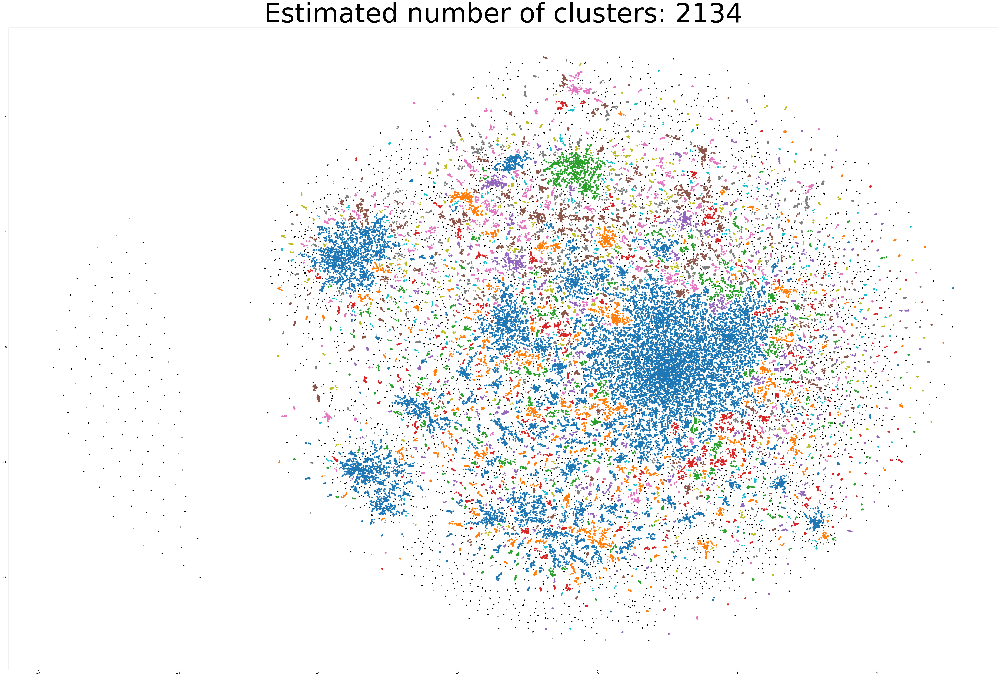

In [12]:
# DBSCAN matplot

figure(num=None, figsize=(60, 40), dpi=100)

# Black removed and is used for noise instead.
unique_labels = set(labels)
colors = [plt.cm.tab10(each)
          for each in np.linspace(0, 1, len(unique_labels))]
for k, col in zip(unique_labels, colors):
    if k == -1:
        # Black used for noise.
        col = [0, 0, 0, 1]

    class_member_mask = (labels == k)

    xy = X[class_member_mask & core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor=tuple(col), markersize=5)

    xy = X[class_member_mask & ~core_samples_mask]
    plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
             markeredgecolor=tuple(col), markersize=3)

plt.title('Estimated number of clusters: %d' % n_clusters_, fontsize=75)
plt.show()